# CLASIFICACIÓN MUSICAL - GTZAN

## Introducción
A lo largo de este trabajo implementaremos diferentes métodos de Machine Learning con el objetivo de analizar pistas de audio musicales y sus espectrogramas para clasificarlos en sus correspondientes géneros.

Para ello utilizaremos el dataset GTZAN, que contiene 1000 pistas de audio de 30 segundos clasificadas en 10 géneros diferentes, junto con las 1000 imágenes de los respectivos espectrogramas. Además, en un archivo csv se recogen 60 variables para cada pista, donde se engloba información relativa a frecuencia, tono, contrastes espectrales, información armónica, etc.

Con el objetivo de aumentar el tamaño del dataset, cada pista de audio se divide en 10 pistas de 3 segundos, siendo este el dataframe que utilizaremos para la mayor parte del trabajo.

## Preparación de datos

### Instalación de librerías 

In [6]:
!jupyter notebook --version

7.0.8


In [7]:
!conda --version

conda 24.9.2


In [8]:
pip install scikit-learn pandas matplotlib seaborn numpy librosa tensorflow

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



### Data Cleansing

In [131]:
print('hola')

hola


In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import librosa

Cargamos el dataframe de pistas de 3 segundos, comprobamos sus dimensiones y observamos las 5 primeras filas.

In [12]:
df = pd.read_csv('Data/features_3_sec.csv')


In [13]:
df.shape

(9990, 60)

In [14]:
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


Eliminamos duplicados en caso de que existieran.

In [16]:
df = df.drop_duplicates()
df.shape 

(9990, 60)

Contamos el número de pistas que tenemos en cada género. Vemos que prácticamente tenemos el mismo número en todas ellas, por lo que podemos considerar que nuestra muestra es relativamente amplia y está repartida equitativamente.

In [18]:
df.label.value_counts().reset_index()

,label,count
0,blues,1000
1,jazz,1000
2,metal,1000
3,pop,1000
4,reggae,1000
5,disco,999
6,classical,998
7,hiphop,998
8,rock,998
9,country,997


A continuación, elegimos una pista de audio cualquiera para comprobar que funciona correctamente. La variable data es la señal de audio en forma de numpy array. Estas números representan las amplitudes de la señal a lo largo del tiempo. En nuestro caso el array es unidimensional ya que las pistas de audios son mono.

La variable sr es el 'sampling rate' o frecuencia de muestreo, es decir, el número de muestras por segundo que se toman de la pista, que por defecto es de 22050 Hz.

In [20]:
audio_example = 'Data/genres_original/rock/rock.00017.wav'
audio_data , sr = librosa.load(audio_example)
print(type(audio_data), type(sr))
print('sr = ',sr,' Hz')

<class 'numpy.ndarray'> <class 'int'>
sr =  22050  Hz


Usamos la librería IPython para crear un widget que nos permita visualizar la pista de audio que hemos elegido.

In [22]:
import IPython
IPython.display.Audio(audio_data, rate=sr)

Visualizamos como varía la amplitud de la señal en función del tiempo.

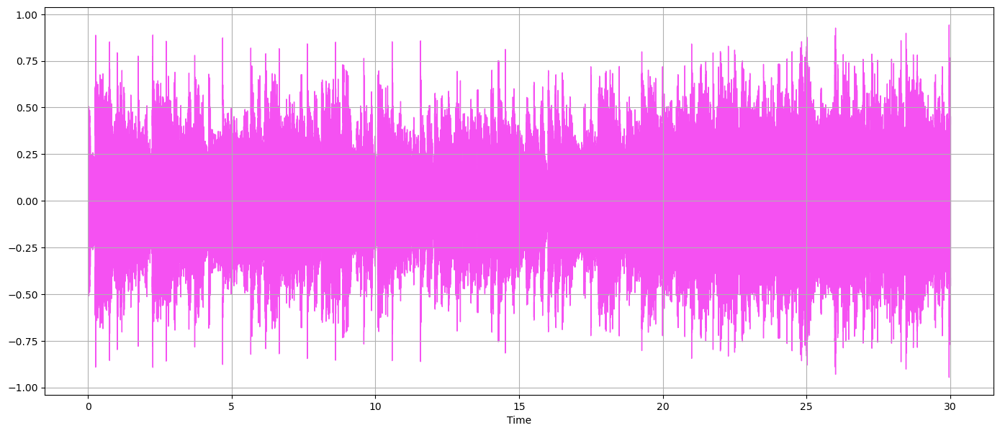

In [24]:
import librosa.display
plt.figure(figsize=(17,7))
plt.grid()
librosa.display.waveshow(audio_data, color='#f551f2')
plt.show()

A continuación, vamos a crear un Mel espectrograma de frecuencias. Para ello transforma la señal de audio al dominio de la frecuencia mediante una Short-time Fourier Transform (STFT) y lo convertimos a escala Mel, que agrupa las frecuencias más altas con menor resolución y las bajas con mayor detalle, para alinearse con cómo escuchamos los sonidos.

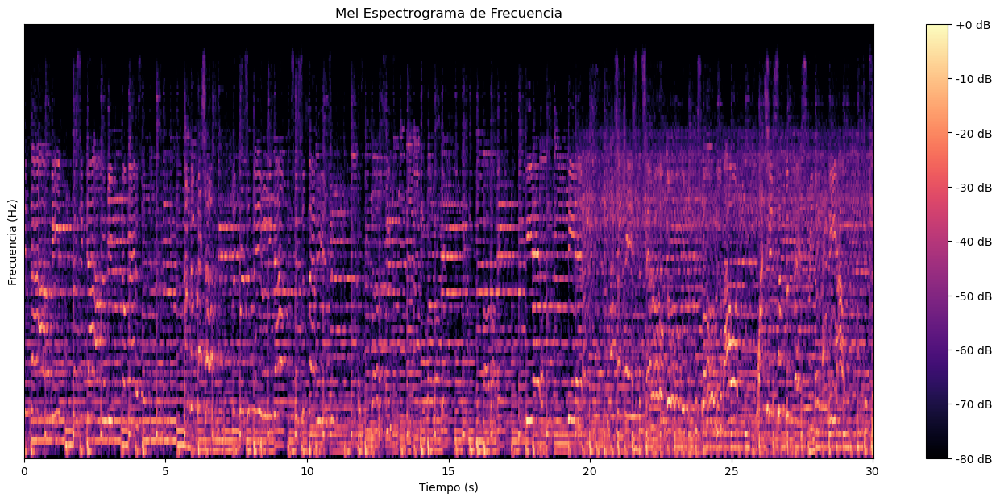

In [26]:
# Creamos el Mel espectrograma
mel_spec_db = librosa.power_to_db(librosa.feature.melspectrogram(y = audio_data, sr = sr, n_fft = 2048, hop_length = 512, n_mels = 128, power = 4.0), ref = np.max)

# Representamos el Mel espectrograma
plt.figure(figsize=(17, 7))
librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='off')
plt.title('Mel Espectrograma de Frecuencia')
plt.colorbar(format='%+2.0f dB')
plt.xlabel('Tiempo (s)')
plt.ylabel('Frecuencia (Hz)')
plt.show()

Con el espectrograma representamos visualmente cómo las frecuencias de la señal de audio, cambian a lo largo del tiempo. Es una herramienta muy usada en el análisis de sonido ya que nos permite observar la energía en diferentes bandas de frecuencia. El color indica la intensidad de la señal a una frecuencia e instante dados. Esto es especialmente útil para el reconocimiento de patrones en audio mediante métodos de Machine Learning, ya que con ello conseguimos asignar valores númericos a pistas de audio.

Una vez tenemos el dataframe cargado es necesario normalizar los datos. Los algoritmos de aprendizaje automático suelen funcionar mejor si las características tienen escalas similares, consiguiendo así mejorar el rendimiento y eficiencia del modelo. 

En nuestro caso, hemos probado diferentes tipos de normalización, tal y como vemos en el código. La que mejores resultados nos proporciona es la normalización Min-Max, que escala los valores a un rango [0,1].

In [29]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler, QuantileTransformer

# Excluimos las columnas 'filename' y 'label' para normalizar solo las características numéricas
data = df.drop(columns=['filename', 'label'])

# Probamos diferentes tipos de normalización
#scaler = StandardScaler()
scaler = MinMaxScaler()
#scaler = MaxAbsScaler()
#scaler = QuantileTransformer()

data_norm = scaler.fit_transform(data)

# Convertimos las características normalizadas a un DataFrame
df_norm = pd.DataFrame(data_norm, columns=data.columns)

# Añadimos de nuevo las columnas 'filename' y 'label' al DataFrame normalizado
df_norm['filename'] = df['filename']
df_norm['label'] = df['label']

df_norm.head()


,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,filename,label
0,0.0,0.355399,0.716757,0.293133,0.107955,0.262173,0.034784,0.459205,0.094130,0.346153,...,0.397172,0.066062,0.371828,0.055344,0.380831,0.026797,0.506746,0.047781,blues.00000.0.wav,blues
1,0.0,0.367322,0.670347,0.253040,0.044447,0.270969,0.018716,0.470831,0.052261,0.363722,...,0.351681,0.074001,0.362068,0.076365,0.418452,0.082414,0.593029,0.065548,blues.00000.1.wav,blues
2,0.0,0.373159,0.728067,0.296753,0.141663,0.265293,0.023073,0.494051,0.059922,0.378215,...,0.420979,0.050639,0.400536,0.067509,0.433742,0.043841,0.546264,0.036062,blues.00000.2.wav,blues
3,0.0,0.399349,0.677066,0.298024,0.075042,0.238427,0.023187,0.455246,0.066234,0.329587,...,0.387474,0.050617,0.380430,0.050030,0.405824,0.041898,0.562204,0.034873,blues.00000.3.wav,blues
4,0.0,0.355668,0.689113,0.322308,0.052149,0.233460,0.016451,0.451651,0.047830,0.318453,...,0.460314,0.083860,0.388590,0.076524,0.409019,0.020763,0.517913,0.031713,blues.00000.4.wav,blues


#### Principal Component Analysis (PCA)

PCA es una técnica que nos permite reducir la dimensionalidad de los datos originales, transformándolo en un nuevo conjunto de variables (componentes principales), que se calculan teniendo en cuenta la varianza de la diferentes características. Esto nos permite reducir el ruido y redundancia de los datos y el tiempo de computación, manteniendo la mayor cantidad de información posible.

In [32]:
from sklearn.decomposition import PCA 

# Excluímos las columnas del dataframe normalizado que contienen NaNs
data = df_norm.drop(columns=['filename', 'label'])

#Fijamos el número de componentes principales que queremos
pca = PCA(n_components=3)
comp_principales = pca.fit_transform(data)
df_principal = pd.DataFrame(data = comp_principales, columns = ['cp1','cp2','cp3'])

# Reintroducimos las etiquetas en el dataframe reducido
df_principal['label'] = df['label']

df_principal_2D = df_principal.drop(columns=['cp3'])
df_principal_2D.head()

,cp1,cp2,label
0,-0.242167,-0.121147,blues
1,-0.276062,-0.230291,blues
2,-0.190024,-0.119509,blues
3,-0.278550,-0.167689,blues
4,-0.309771,-0.187990,blues


En primer lugar, tomamos dos componentes principales y observamos la distribución espacial de los datos.

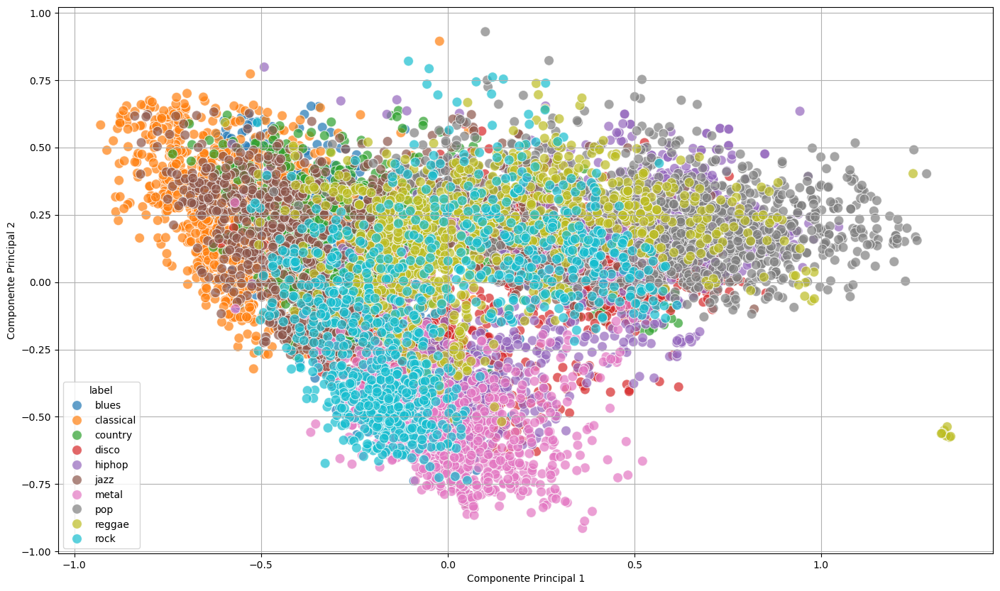

In [34]:
import seaborn as sns

# Creamos el gráfico
fig = plt.figure(figsize = (17,10))
sns.scatterplot(x = 'cp1', y = 'cp2', data = df_principal, hue = 'label', alpha = 0.7, s = 100 )
plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.grid()


Con la normalización escogida, vemos que la distribución de los datos no está demasiado diferenciada, aunque sí podemos apreciar cierta tendencia de agrupación de los géneros (especialmente en 'classical' y 'metal'). Por ello, añadimos una tercera componente principal y representamos los datos obtenidos en un gráfico 3D.

In [36]:
df_principal.head()

,cp1,cp2,cp3,label
0,-0.242167,-0.121147,0.071058,blues
1,-0.276062,-0.230291,0.038986,blues
2,-0.190024,-0.119509,0.067502,blues
3,-0.278550,-0.167689,0.052075,blues
4,-0.309771,-0.187990,0.029072,blues


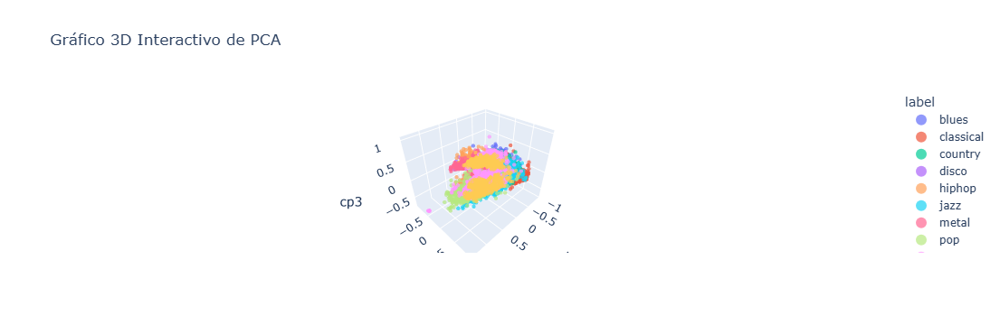

In [37]:
import plotly.express as px

# Creamos el gráfico 3D interactivo con Plotly
fig = px.scatter_3d(
    df_principal, x='cp1', y='cp2', z='cp3', 
    color='label', 
    size=[0.1]*len(df_principal),
    size_max = 7, 
    labels={'PC1': 'Componente Principal 1', 'PC2': 'Componente Principal 2', 'PC3': 'Componente Principal 3'},
    title="Gráfico 3D Interactivo de PCA")

fig.update_traces(marker=dict(line=dict(width=0)))

# Mostramos el gráfico 
fig.show()




Se podría aumentar el número de componentes principales, aunque esto no necesariamente implica una mejora del modelo, ya que podría causar "overfitting". Por ello hemos restringido la dimensionalidad a 3 componentes principales.

La respuesta del modelo a los datos transformados con el PCA depende del tipo utilizado. En nuestro caso, hemos probado tanto con 2 componentes principales como con 3, aunque los resultados obtenidos han sido considerablemente peores en todos los casos. Todo ello, sumado a que el tiempo de cómputo es aceptable, hemos decidido descartar esta transformación y trabajar directamente con el dataframe. 

#### Asignación de valores a las etiquetas

Antes de empezar a probar los diferentes modelos es necesario asignar un valor numérico a cada etiqueta. En nuestro caso hemos asignado a cada uno de los 10 géneros un número entre 0 y 9.

In [41]:
from sklearn.preprocessing import LabelEncoder

generos=df_principal['label']
encoder = LabelEncoder()
generos_enc = encoder.fit_transform(generos)

# Visualizamos los valores para verificar que sea correcto
print(np.unique(generos_enc))

[0 1 2 3 4 5 6 7 8 9]


#  Entrenamiento y prueba de los diferentes modelos

## División de datos

Comenzamos dividiendo nuestro conjunto de datos en dos subconjuntos, 70% para el de entrenamiento y 30% para el de test.

In [45]:
from sklearn.model_selection import train_test_split

# Definimos las variables x e y
x = df_norm.drop(columns=['filename', 'label'])
y = generos_enc 

# Dividimos los datos
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, stratify=y, random_state = 42)

# Comprobamos que la división sea correcta
print(len(x_train))
print(len(x_test))

6993
2997


##  k-Nearest Neighbors (k-NN)

Comenzamos probando el algoritmo k-Nearest Neighbors (k-NN). Con este método se clasifica un dato nuevo basándose en la cercanía a otros datos previamente clasificados. Primero se elige un valor para "k" (número de vecinos), luego se calcula la distancia entre el dato nuevo y todos los datos en el conjunto de entrenamiento. Los "k" vecinos más cercanos "votan" por su clase, y el nuevo dato se clasifica en la clase mayoritaria de sus vecinos.

Para intentar evitar que el método sobreentrene los datos (overfitting), realizaremos una validación cruzada. Esta es una técnica para evaluar el rendimiento de un modelo dividiendo el conjunto de datos en varios subconjuntos (folds). En cada iteración, se entrena el modelo con algunos de estos subconjuntos y se prueba con los restantes, rotando los subconjuntos hasta cubrir todas las combinaciones posibles. El rendimiento final se calcula como el promedio de las evaluaciones obtenidas en cada iteración, lo que permite medir la capacidad del modelo para generalizar en datos no vistos y reduce el riesgo de sobreajuste.

In [49]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Definimos el modelo k-NN 
k = 10  # Número de vecinos próximos
KNN = KNeighborsClassifier(n_neighbors=k)

# Validación cruzada
folds = 10  # Número de folds
cv_scores = cross_val_score(KNN, x_train, y_train, cv=folds, scoring='accuracy')
print(f"Precisión promedio en la validación cruzada ({folds} folds): {np.mean(cv_scores) * 100:.2f}%")

# Entrenamos el modelo 
KNN.fit(x_train, y_train)

# Predicciones y reporte
y_pred_KNN = KNN.predict(x_test)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred_KNN, target_names=encoder.classes_))

# Calculamos la precisión del modelo
accuracy_KNN = accuracy_score(y_test, y_pred_KNN)
print(f"Precisión del modelo KNN con k={k}: {accuracy_KNN * 100:.2f}%")

Precisión promedio en la validación cruzada (10 folds): 84.94%
Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.88      0.86      0.87       300
   classical       0.89      0.96      0.92       299
     country       0.77      0.80      0.78       299
       disco       0.74      0.88      0.80       300
      hiphop       0.85      0.85      0.85       299
        jazz       0.87      0.84      0.85       300
       metal       0.97      0.89      0.93       300
         pop       0.95      0.80      0.87       300
      reggae       0.84      0.87      0.85       300
        rock       0.81      0.76      0.79       300

    accuracy                           0.85      2997
   macro avg       0.86      0.85      0.85      2997
weighted avg       0.86      0.85      0.85      2997

Precisión del modelo KNN con k=10: 85.22%


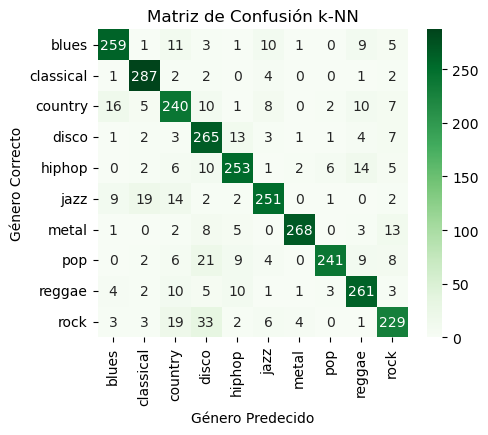

In [50]:
# Obtenemos de la matriz de confusión
conf_matrix_KNN = confusion_matrix(y_test, y_pred_KNN)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_KNN, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión k-NN')
plt.show()

Observamos que el k-NN clasifica las pista de forma bastante satisfactoria, especialmente para 'blues', 'classical', 'metal' y 'reggae'. 

## Support Vector Machine (SVM) 

El algoritmo Support Vector Machine (SVM) clasifica datos separando las clases mediante un "hiperplano" óptimo en el espacio de características. Este hiperplano maximiza la distancia entre los puntos de datos de las diferentes clases, conocidos como "margen". SVM se enfoca en los puntos más cercanos al margen (vectores de soporte) para definir esta separación óptima.

In [54]:
from sklearn.svm import SVC

# Definimos el modelo SVM
SVM = SVC(kernel = 'linear')

# Entrenamos el modelo
SVM.fit(x_train, y_train)

# Predicciones y reporte
y_pred_SVM = SVM.predict(x_test)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred_SVM, target_names=encoder.classes_))

# Evaluamos la precisión del modelo
accuracy_SVM = accuracy_score(y_test, y_pred_SVM)
print(f'Precisión del modelo SVM: {accuracy_SVM * 100:.2f}%')

Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.65      0.75      0.70       300
   classical       0.88      0.95      0.92       299
     country       0.68      0.59      0.63       299
       disco       0.65      0.61      0.63       300
      hiphop       0.71      0.62      0.66       299
        jazz       0.76      0.83      0.80       300
       metal       0.81      0.86      0.83       300
         pop       0.84      0.79      0.81       300
      reggae       0.65      0.67      0.66       300
        rock       0.56      0.54      0.55       300

    accuracy                           0.72      2997
   macro avg       0.72      0.72      0.72      2997
weighted avg       0.72      0.72      0.72      2997

Precisión del modelo SVM: 72.14%


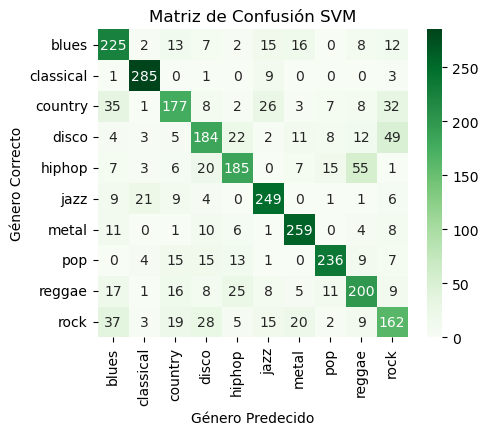

In [55]:
# Obtenemos de la matriz de confusión
conf_matrix_SVM = confusion_matrix(y_test, y_pred_SVM)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_SVM, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión SVM')
plt.show()

Podemos ver que la precisión del SVM es inferior a la del k-NN, clasificando mejor (otra vez) los géneros 'classical' y 'metal', mientras que 'rock' presenta el menor ratio de acierto.

## Decision Tree

El algoritmo Decision Tree clasifica datos creando un modelo en forma de árbol, donde cada nodo representa una pregunta o condición sobre una característica específica del dato. Empezando desde la raíz, el árbol divide los datos en subconjuntos más pequeños en función de sus características, tomando decisiones en cada nodo hasta llegar a una clasificación en las hojas. Estas divisiones se eligen para maximizar la "pureza" de cada rama, de manera que los datos similares queden agrupados.

In [59]:
from sklearn.tree import DecisionTreeClassifier

# Definimos el modelo de Decision Tree
DT = DecisionTreeClassifier(random_state=42)

# Entrenamos el modelo
DT.fit(x_train, y_train)

# Predicciones y reporte
y_pred_DT = DT.predict(x_test)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred_DT, target_names=encoder.classes_))

# Evaluamos la precisión del modelo
accuracy_DT = accuracy_score(y_test, y_pred_DT)
print(f"Precisión del modelo Decision Tree: {accuracy_DT * 100:.2f}%")


Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.62      0.67      0.64       300
   classical       0.81      0.84      0.82       299
     country       0.52      0.50      0.51       299
       disco       0.56      0.56      0.56       300
      hiphop       0.60      0.60      0.60       299
        jazz       0.68      0.64      0.66       300
       metal       0.73      0.76      0.75       300
         pop       0.74      0.66      0.70       300
      reggae       0.66      0.65      0.66       300
        rock       0.46      0.47      0.46       300

    accuracy                           0.64      2997
   macro avg       0.64      0.64      0.64      2997
weighted avg       0.64      0.64      0.64      2997

Precisión del modelo Decision Tree: 63.60%


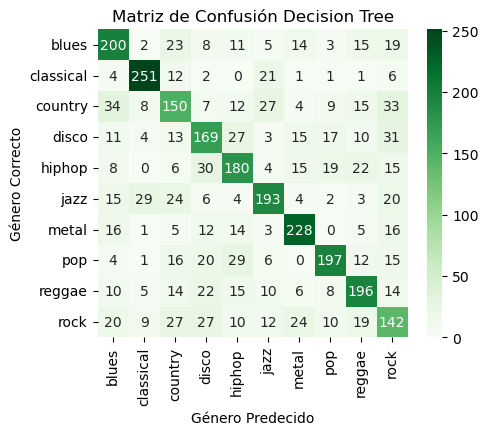

In [60]:
# Matriz de confusión
conf_matrix_DT = confusion_matrix(y_test, y_pred_DT)

# Visualización de la matriz de confusión
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_DT, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión Decision Tree')
plt.show()

Con este algoritmo vemos que la precisión es bastante menor a los dos modelos anteriores, aunque de nuevo podemos ver que sigue clasificando correctamente los géneros 'classical' y 'metal'. En el resto de géneros se pierde precisión, especialmente en 'country' y 'rock'.

## Regresión Logística

La regresión logística es un algoritmo de clasificación que estima la probabilidad de que un dato pertenezca a una clase específica. Utiliza una función sigmoide para transformar una combinación lineal de las características del dato en un valor entre 0 y 1, que representa esta probabilidad. Si la probabilidad es mayor que un umbral (habitualmente 0.5), el dato se clasifica en una clase; de lo contrario, en la otra. 

In [64]:
from sklearn.linear_model import LogisticRegression

# Definimos el modelo de Árbol de Decisión
LR = LogisticRegression(max_iter=10000,random_state=42)

# Entrenamos el modelo
LR.fit(x_train, y_train)

# Predicciones y reporte
y_pred_LR = LR.predict(x_test)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred_LR, target_names=encoder.classes_))

# Evaluamos la precisión del modelo
accuracy_LR = accuracy_score(y_test, y_pred_LR)
print(f"Precisión del modelo Regresión Logística: {accuracy_LR * 100:.2f}%")


Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.62      0.66      0.64       300
   classical       0.87      0.95      0.91       299
     country       0.64      0.56      0.60       299
       disco       0.62      0.58      0.60       300
      hiphop       0.68      0.55      0.61       299
        jazz       0.75      0.80      0.77       300
       metal       0.73      0.88      0.79       300
         pop       0.77      0.77      0.77       300
      reggae       0.59      0.65      0.62       300
        rock       0.55      0.49      0.52       300

    accuracy                           0.69      2997
   macro avg       0.68      0.69      0.68      2997
weighted avg       0.68      0.69      0.68      2997

Precisión del modelo Regresión Logística: 68.67%


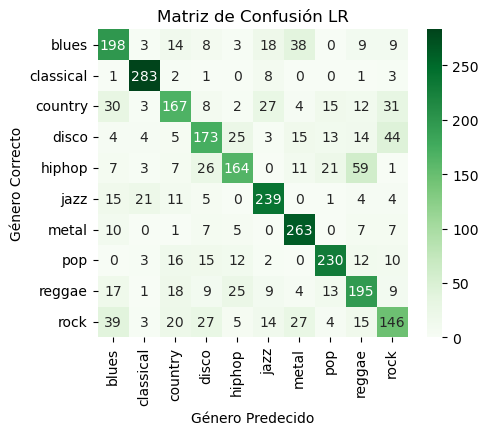

In [65]:
# Visualizamos de la matriz de confusión
conf_matrix_LR = confusion_matrix(y_test, y_pred_LR)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_LR, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión LR')
plt.show()

Observamos que este modelo predice relativamente bien los géneros (con una precisión de casi el 70%), pese a que este método tiende a funcionar mejor cuando el problema es binario, es decir, donde el número de conjuntos es dos. 

## Red Neuronal Artificial (ANN)

Las Redes Neuronales Artificiales (ANN) son modelos de machine learning inspirados en el funcionamiento del cerebro humano. Están compuestas por capas de "neuronas" artificiales que procesan y transforman datos a través de conexiones con "pesos" ajustables. La estructura básica consta de tres tipos de capas:

    1. Capa de entrada: reciben las características de los datos.
    2. Capas ocultas: procesan la información mediante funciones de activación, aplicando transformaciones no lineales.
    3. Capa de salida: genera la predicción final.
    
En nuestro caso, después de probar con diferentes capas y densidades de cada una, hemos elegido 6 capas. Entre ellas tenemos algunas densas, en las que hemos reducido la densidad paulatinamente, combinadas con capas de "Dropout", que apagan neuronas aleatoriamente ayudando así a reducir el overfitting. Finalmente, ajustamos la capa de salida para que tenga el mismo número de neuronas que géneros. 


In [69]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Definimos de la red neuronal
model = Sequential()
model.add(Dense(512, activation='relu', input_shape=(x_train.shape[1],)))
model.add(Dropout(0.5)) 
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu'))
model.add(Dense(len(np.unique(y)), activation='softmax'))  # Capa de salida 

# Compilamos el modelo
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Entrenamos el modelo
hist_ANN = model.fit(x_train, y_train, epochs=200, batch_size=64, validation_split=0.3)

Epoch 1/200


C:\Users\USUARIO\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



77/77 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.1660 - loss: 2.2447 - val_accuracy: 0.4090 - val_loss: 1.6327
Epoch 2/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3578 - loss: 1.7317 - val_accuracy: 0.4833 - val_loss: 1.4185
Epoch 3/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4445 - loss: 1.4822 - val_accuracy: 0.5424 - val_loss: 1.2740
Epoch 4/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4989 - loss: 1.3643 - val_accuracy: 0.5748 - val_loss: 1.1917
Epoch 5/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5131 - loss: 1.3028 - val_accuracy: 0.6030 - val_loss: 1.1280
Epoch 6/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5384 - loss: 1.2318 - val_accuracy: 0.6030 - val_loss: 1.1021
Epoch 7/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5641 - loss: 1.1829 - val_accuracy: 0.6111 - val_loss: 1.0857
Epoch 8/200
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5745 - loss: 1.1441 - val_accuracy: 0.6459 - val_loss: 1.0

Después de varias pruebas, variando la densidad de cada capa, el número de capas, el número de etapas (epochs) y el tamaño de la muestra de cada iteración (batch_size), concluimos los valores que mejores resultados predicen son los anteriormente mostrados. Para comprobar que la red funciona correctamente representamos la evolución de la precisión y la pérdida a lo largo de las etapas.

<Figure size 640x480 with 0 Axes>

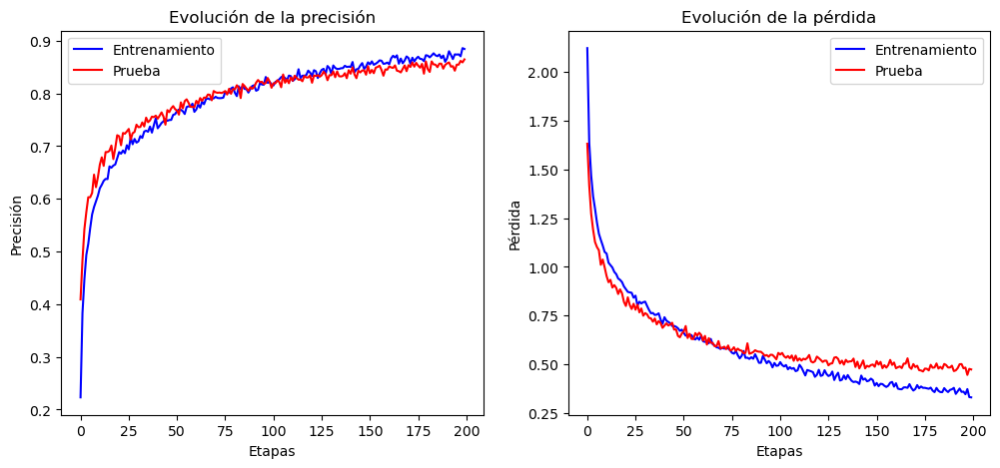

In [71]:
# Graficamos la evolución de precisión y la pérdida
plt.figure()
plt.figure(figsize=(12, 5))

# Gráfica de Precisión
plt.subplot(1, 2, 1)
plt.plot(hist_ANN.history['accuracy'], label='Entrenamiento', color='blue')
plt.plot(hist_ANN.history['val_accuracy'], label='Prueba', color='red')
plt.xlabel('Etapas')
plt.ylabel('Precisión')
plt.legend()
plt.title('Evolución de la precisión')

# Gráfica de Pérdida
plt.subplot(1, 2, 2)
plt.plot(hist_ANN.history['loss'], label='Entrenamiento', color='blue')
plt.plot(hist_ANN.history['val_loss'], label='Prueba', color='red')
plt.xlabel('Etapas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la pérdida')
plt.show()
plt.close()

Como podemos observar en las figuras la evolución de los conjuntos de entrenamiento y prueba es muy similar, tanto para la precisión como para la pérdida. Cabe destacar que ambas curvas se empiezan a separar a medida que nos acercamos a las 200 etapas. Además, vemos que la precisión tampoco aumenta por lo que hemos decidido detener el entrenamiento en este punto. 

Finalmente, al igual que con los modelos anteriores, presentamos el reporte de clasificación y la matriz de confusión. 

94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.83      0.88      0.85       300
   classical       0.91      0.95      0.93       299
     country       0.81      0.76      0.78       299
       disco       0.86      0.80      0.83       300
      hiphop       0.85      0.82      0.84       299
        jazz       0.84      0.90      0.87       300
       metal       0.85      0.92      0.88       300
         pop       0.91      0.83      0.86       300
      reggae       0.82      0.82      0.82       300
        rock       0.76      0.75      0.75       300

    accuracy                           0.84      2997
   macro avg       0.84      0.84      0.84      2997
weighted avg       0.84      0.84      0.84      2997

Precisión del modelo ANN: 84.35%


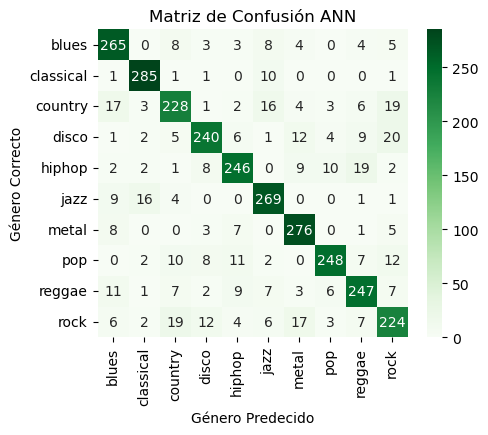

In [74]:
# Predicciones y reporte
y_pred_ANN = np.argmax(model.predict(x_test), axis=1)
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred_ANN, target_names=encoder.classes_))

# Evaluamos la precisión del modelo
accuracy_ANN = accuracy_score(y_test, y_pred_ANN)
print(f"Precisión del modelo ANN: {accuracy_ANN * 100:.2f}%")

# Visualizamos de la matriz de confusión
conf_matrix_ANN = confusion_matrix(y_test, y_pred_ANN)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_ANN, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión ANN')
plt.show()

Vemos que esta red neuronal es uno de los modelos que mejor predicen los géneros (junto con el k-NN). Nuevamente los géneros mejor clasificados son "classical" y "metal".

## Red Neuronal Convolucional (CNN)

Las Redes Neuronales Convolucionales (CNN) son redes diseñadas para procesar datos con una estructura de tipo cuadrícula, como imágenes. Aprovechan las características espaciales de estos datos para aprender patrones locales mediante convoluciones. Al igual que en las ANN tenemos diferentes tipos de capas:

    1. Capas de Convolución: Aplican filtros que recorren la imagen y extraen características locales, como bordes, texturas o formas, conservando la relación espacial entre píxeles.
    2. Capas Pooling: Reducen la dimensionalidad de las características extraídas, preservando la información más relevante.
    3. Capas Densas: Estas capas conectan todas las características extraídas para realizar la clasificación final o predicción.

Como hemos visto anteriormente, podemos crear un Mel espectrograma a partir de las pistas de audio. Sin embargo, la base de datos incluye ya las imágenes de estos espectrogramas, por lo que, para acortar el tiempo de cómputo, las cargamos directamente de las carpetas.

In [79]:
import os
from keras.preprocessing import image

# Creamos una función para cargar las imágenes y sus etiquetas
def load_images_from_path(path, label):
    images = []
    labels = []

    for file in os.listdir(path):
        img_path = os.path.join(path, file)
        # Cargamos la imagen y la redimensionamos
        img = image.load_img(img_path, target_size=(128, 128))  # Ajustamos el tamaño de la imagen
        img_array = image.img_to_array(img)  # Convertimos la imagen a un array
        images.append(img_array)
        labels.append(label)  # Asignamos la etiqueta correspondiente
    return images, labels
    
# Creamos una función para mostrar las imágenes
def show_images(images):
    fig, axes = plt.subplots(1, 8, figsize=(20, 20), subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i] / 255.0)  # Normalizamos la imagen para visualizarla
        else:
            ax.axis('off') 
            
    plt.show()

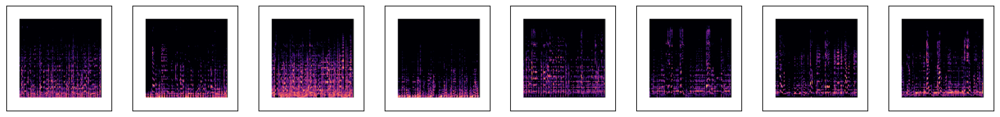

In [80]:
# Lista de géneros musicales
genres = ['blues','classical','country','disco','hiphop','jazz','metal','pop','reggae','rock']

# Ruta base 
base_path = 'Data/images_original' 

# Inicializamos listas para almacenar imágenes y etiquetas
x = []
y = []

# Creamos un blucle para cargar imágenes de cada carpeta
for genre in genres:
    genre_path = os.path.join(base_path, genre)  # Construimos la ruta para cada género
    if os.path.exists(genre_path):  # Verificamos si la ruta existe
        images, labels = load_images_from_path(genre_path, genre)  # Cargamos imágenes y etiquetas
        x.extend(images)  # Agregamos las imágenes a la lista principal
        y.extend(labels)  # Agregamos las etiquetas a la lista principal
    else:
        print(f"Advertencia: La ruta '{genre_path}' no existe.")
        
# Convertimos a arrays de NumPy
x = np.array(x)
y = np.array(y)

# Asignamos valores numéricos a las etiquetas
y_enc = encoder.fit_transform(y)

# Mostramos algunas imágenes
show_images(x[:8])  

Al igual que con los anteriores modelos, dividimos nuestro conjunto de imágenes en dos subconjuntos: entrenamiento y prueba. 

In [82]:
from tensorflow.keras.utils import to_categorical

x_train_CNN, x_test_CNN, y_train_CNN, y_test_CNN = train_test_split(x, y_enc, stratify=y, test_size=0.3, random_state=42)

# Normalizamos
x_train_norm = np.array(x_train_CNN) / 255
x_test_norm = np.array(x_test_CNN) / 255

# Transformamos al formato One-Hot Encoding
y_train_encoded = to_categorical(y_train_CNN)
y_test_encoded = to_categorical(y_test_CNN)

Una vez hemos preparado los datos, definimos el modelo. Al igual que con el ANN hemos probado con diferente número de capas y densidades. También hemos probado a introducir capas dropout, para reducir el overfitting, pero los resultados no mejoraban, por lo que decidimos suprimirlas. Incluso intentamos redimensionar las imágenes (tanto a aumentarlas como a reducirlas) sin obtener resultados satisfactorios. Como intento final, probamos a aumentar el número de imágenes (duplicándolas, rotándolas,...), aunque en este caso el modelo no mejoraba, ya que la información del espectrograma se pierde al rotarlo.

Finalmente, los valores de batch_size y epochs que mejor predicen nuestros datos son los que se muestran a continuación.

In [85]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.callbacks import EarlyStopping

# Definimos el modelo
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Dense(128, activation='relu'))
model.add(Flatten())
model.add(Dense(10, activation='softmax'))  # Ajustamos a 10 el número de neuronas de salida

# Compilamos el modelo
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Entrenamos el modelo
hist_CNN = model.fit(x_train_norm, y_train_encoded, validation_data=(x_test_norm, y_test_encoded), batch_size=64, epochs=20)

Epoch 1/20


C:\Users\USUARIO\AppData\Roaming\Python\Python312\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



11/11 ━━━━━━━━━━━━━━━━━━━━ 4s 269ms/step - accuracy: 0.0756 - loss: 3.3349 - val_accuracy: 0.1000 - val_loss: 2.2604
Epoch 2/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - accuracy: 0.2101 - loss: 2.2172 - val_accuracy: 0.2700 - val_loss: 2.1049
Epoch 3/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - accuracy: 0.2787 - loss: 2.0050 - val_accuracy: 0.3000 - val_loss: 1.8666
Epoch 4/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.4065 - loss: 1.7385 - val_accuracy: 0.4167 - val_loss: 1.7550
Epoch 5/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - accuracy: 0.5003 - loss: 1.6004 - val_accuracy: 0.4567 - val_loss: 1.5714
Epoch 6/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 263ms/step - accuracy: 0.5487 - loss: 1.3244 - val_accuracy: 0.5100 - val_loss: 1.4971
Epoch 7/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - accuracy: 0.6464 - loss: 1.1172 - val_accuracy: 0.5433 - val_loss: 1.3576
Epoch 8/20
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.7733 - loss: 0.8780 - val_accuracy: 0.5267 - val_

Representamos la evolución del aprendizaje de la red.

<Figure size 640x480 with 0 Axes>

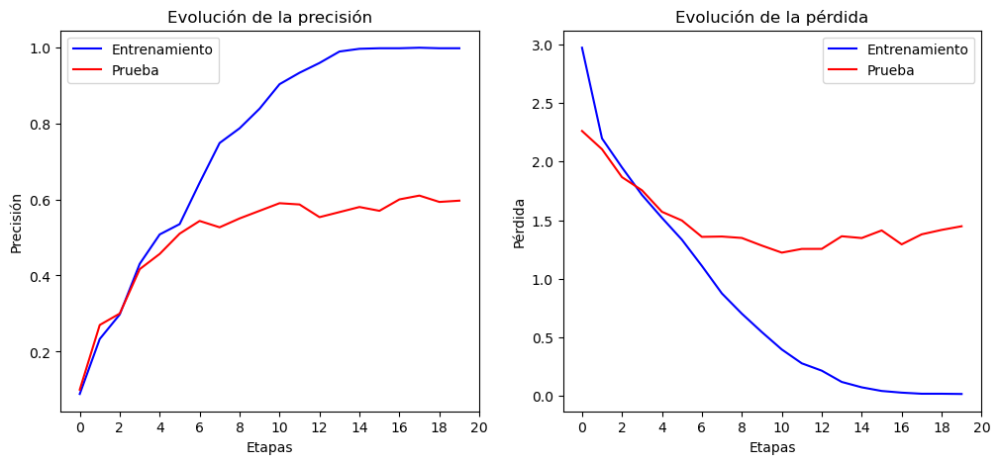

In [87]:
# Graficamos la evolución de precisión y la pérdida
plt.figure()
plt.figure(figsize=(12, 5))

# Gráfica de Precisión
plt.subplot(1, 2, 1)
plt.plot(hist_CNN.history['accuracy'], label='Entrenamiento', color='blue')
plt.plot(hist_CNN.history['val_accuracy'], label='Prueba', color='red')
plt.xticks(ticks=range(0, 21, 2))
plt.xlabel('Etapas')
plt.ylabel('Precisión')
plt.legend()
plt.title('Evolución de la precisión')

# Gráfica de Pérdida
plt.subplot(1, 2, 2)
plt.plot(hist_CNN.history['loss'], label='Entrenamiento', color='blue')
plt.plot(hist_CNN.history['val_loss'], label='Prueba', color='red')
plt.xticks(ticks=range(0, 21, 2))
plt.xlabel('Etapas')
plt.ylabel('Pérdida')
plt.legend()
plt.title('Evolución de la pérdida')
plt.show()
plt.close()

Vemos que, si bien la red aprende de forma aceptable en las primeras etapas, la precisión no aumenta ni la pérdida disminuye. Por lo tanto, aumentar el número de etapas tampoco haría que el modelo mejore. Lo que creemos que está pasando es que el bajo número de imágenes de las que disponemos están limitando el correcto aprendizaje de la red CNN. Esto nos genera overfitting, ajustando muy bien los puntos del conjunto de entrenamiento, pero haciendo que el modelo no tenga capacidad de generalizar.

Finalmente, realizamos el reporte de clasificación y representamos la matriz de confusión para poder comparar más fácilmente el modelo con el resto de métodos.

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step
Reporte de clasificación:
              precision    recall  f1-score   support

       blues       0.67      0.47      0.55        30
   classical       0.93      0.87      0.90        30
     country       0.35      0.40      0.38        30
       disco       0.64      0.47      0.54        30
      hiphop       0.52      0.47      0.49        30
        jazz       0.82      0.77      0.79        30
       metal       0.95      0.70      0.81        30
         pop       0.55      0.70      0.62        30
      reggae       0.45      0.50      0.48        30
        rock       0.40      0.63      0.49        30

    accuracy                           0.60       300
   macro avg       0.63      0.60      0.60       300
weighted avg       0.63      0.60      0.60       300

Precisión del modelo CNN: 59.67%


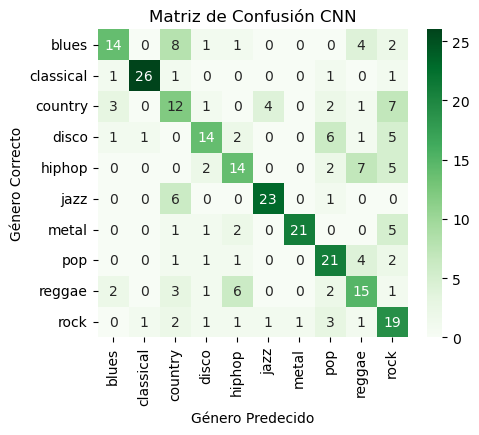

In [90]:
# Predicciones y reporte
y_pred_CNN = np.argmax(model.predict(x_test_norm), axis=1)
y_test_classes = np.argmax(y_test_encoded, axis=1) # Convertimos de one-hot encoding a etiquetas de clase
print("Reporte de clasificación:")
print(classification_report(y_test_classes, y_pred_CNN, target_names=encoder.classes_))

# Evaluamos la precisión del modelo
accuracy_CNN = accuracy_score(y_test_classes, y_pred_CNN)
print(f"Precisión del modelo CNN: {accuracy_CNN * 100:.2f}%")

# Visualizamos de la matriz de confusión
conf_matrix_CNN = confusion_matrix(y_test_classes, y_pred_CNN)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_CNN, annot=True, fmt='d', cmap='Greens', xticklabels=encoder.classes_, yticklabels=encoder.classes_)
plt.xlabel('Género Predecido')
plt.ylabel('Género Correcto')
plt.title('Matriz de Confusión CNN')
plt.show()

En este caso la precisión no es demasiado buena, especialmente en "rock" y "blues", aunque de nuevo el género "classical" lo clasifica bastante bien.

## Conclusiones

A modo de resumen, recopilamos en la siguiente todos los modelos probados junto a su precisión.

In [94]:
from IPython.display import display, HTML


resultados = {
    "Modelo":["k-Nearest Neighbors","Support Vector Machine","Decision Tree",
              "Regresión Logística","Red Neuronal Artificial","Red Neuronal Convolucional"],
 "Precisión":[f"{accuracy_KNN * 100:.2f}%",f"{accuracy_SVM * 100:.2f}%",f"{accuracy_DT * 100:.2f}%",
              f"{accuracy_LR * 100:.2f}%",f"{accuracy_ANN * 100:.2f}%",f"{accuracy_CNN * 100:.2f}%"]}

tabla = pd.DataFrame(resultados)

display(HTML(tabla.to_html(index=False)))

Modelo,Precisión
k-Nearest Neighbors,85.22%
Support Vector Machine,72.14%
Decision Tree,63.60%
Regresión Logística,68.67%
Red Neuronal Artificial,84.35%
Red Neuronal Convolucional,59.67%


Como se recoge en la tabla y como hemos visto a lo largo del trabajo, los modelos que mejor clasifican el género musical son el k-Nearest Neighbors y el ANN, superando el 80% de precisión. Los que peor predicen son el Decision Tree y el CNN, mientras que el SVM y la Regresión Logística nos dan unos resultados intermedios, sin lograr alcanzar a los dos primeros. 

Pese a todo, teniendo en cuenta que estamos clasificando las pistas en 10 géneros diferentes, vemos que todos los modelos predicen relativamente bien. En ningún caso la clasificación es aleatoria, puesto que en ese caso la precisión sería de ~10%.